<a href="https://colab.research.google.com/github/cyal8rr/Dog-Vision-/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/dog-breed-identification.zip"

# End to End multiclass dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

Getting our workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version:",tf.__version__)

TF version: 2.9.2


In [ ]:
print("GPU","available(Yes)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available(Yes)


In [ ]:
## Getting our data ready
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head(5))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


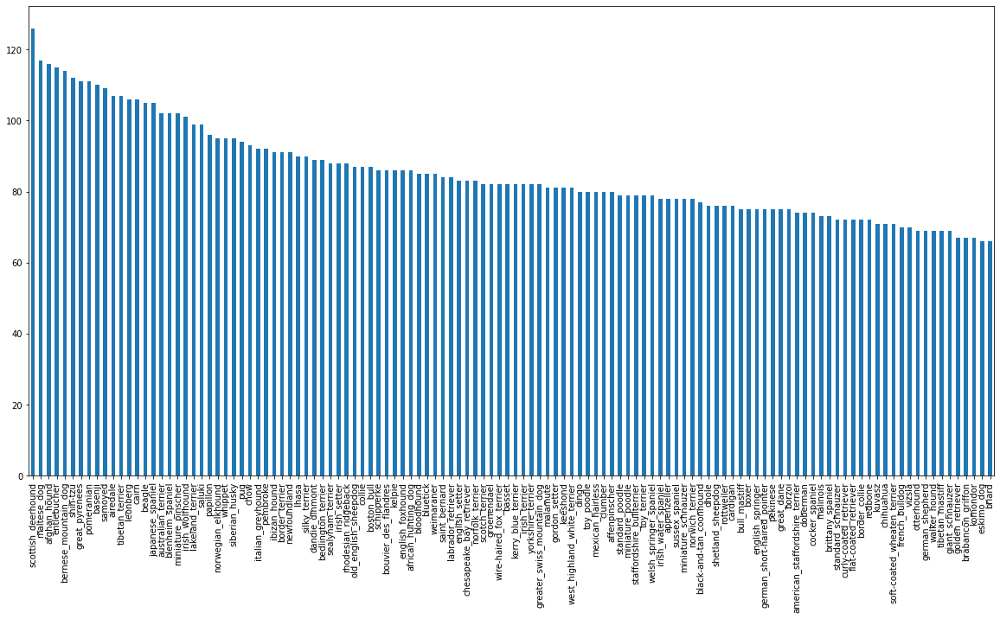

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize =(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

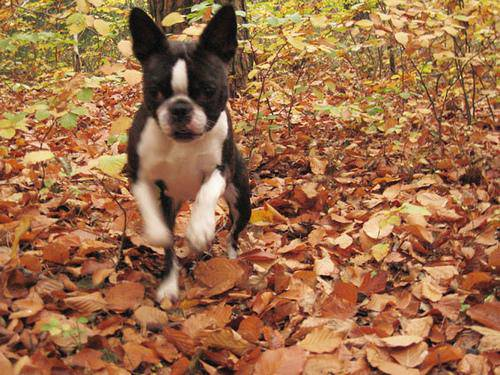

In [ ]:
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
filenames = ["drive/My Drive/Dog Vision/train/" + fname +".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os 
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("File names is = to train data")
else:
  print("Not Equal")

File names is = to train data


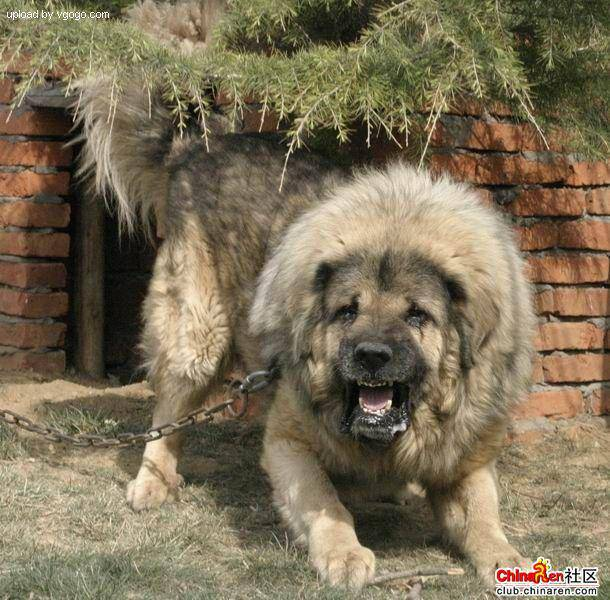

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have changed our image file paths in a list, now lets prepare our labesl

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels.dtype
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("True")
else:
  print("False")

True


In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)


120

In [ ]:
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [labels== unique_breeds for labels in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Creating a Validation Set

In [ ]:
X= filenames
y = boolean_labels

We are going to use 1000 images for starters.


In [ ]:
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Now we will import train test split
from sklearn.model_selection import train_test_split



# Spliting the data into training and validation of total size of NUM_IMAGES
X_train, X_Val, y_train, y_Val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_Val), len(y_train), len(y_Val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images into Tensors.

To preprocess our Images into Tensors we're going to write a function which does a few things:
1.  Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image`(a 'jpeg') into Tensors
4. Resize the images to be a shape of (224,224)
5. Return the modified

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[41])
image.shape

(375, 500, 3)

In [ ]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[63, 52, 24],
        [62, 51, 23],
        [60, 48, 22],
        ...,
        [60, 41, 26],
        [62, 43, 28],
        [63, 44, 29]],

       [[64, 53, 25],
        [63, 52, 24],
        [61, 49, 23],
        ...,
        [61, 42, 27],
        [62, 43, 28],
        [64, 45, 30]]], dtype=uint8)>

In [ ]:
tf.constant(image)[:42]

<tf.Tensor: shape=(42, 500, 3), dtype=uint8, numpy=
array([[[ 63,  52,  24],
        [ 62,  51,  23],
        [ 60,  48,  22],
        ...,
        [ 60,  41,  26],
        [ 62,  43,  28],
        [ 63,  44,  29]],

       [[ 64,  53,  25],
        [ 63,  52,  24],
        [ 61,  49,  23],
        ...,
        [ 61,  42,  27],
        [ 62,  43,  28],
        [ 64,  45,  30]],

       [[ 65,  54,  26],
        [ 64,  53,  25],
        [ 62,  50,  24],
        ...,
        [ 62,  43,  28],
        [ 63,  44,  29],
        [ 64,  45,  30]],

       ...,

       [[ 77,  92,  33],
        [ 77,  92,  33],
        [ 78,  93,  34],
        ...,
        [104, 107,  36],
        [104, 107,  36],
        [104, 107,  36]],

       [[ 76,  94,  34],
        [ 76,  94,  34],
        [ 78,  93,  34],
        ...,
        [104, 107,  36],
        [104, 107,  36],
        [104, 107,  36]],

       [[ 74,  94,  33],
        [ 74,  94,  33],
        [ 76,  94,  34],
        ...,
        [105, 111,  39

In [ ]:
image

array([[[ 63,  52,  24],
        [ 62,  51,  23],
        [ 60,  48,  22],
        ...,
        [ 60,  41,  26],
        [ 62,  43,  28],
        [ 63,  44,  29]],

       [[ 64,  53,  25],
        [ 63,  52,  24],
        [ 61,  49,  23],
        ...,
        [ 61,  42,  27],
        [ 62,  43,  28],
        [ 64,  45,  30]],

       [[ 65,  54,  26],
        [ 64,  53,  25],
        [ 62,  50,  24],
        ...,
        [ 62,  43,  28],
        [ 63,  44,  29],
        [ 64,  45,  30]],

       ...,

       [[ 13,   6,   0],
        [ 18,  11,   1],
        [ 26,  17,  10],
        ...,
        [193, 166,  79],
        [197, 170,  83],
        [199, 172,  85]],

       [[ 21,  14,   4],
        [ 21,  14,   4],
        [ 22,  13,   6],
        ...,
        [196, 168,  84],
        [201, 173,  89],
        [204, 176,  92]],

       [[ 25,  18,   8],
        [ 20,  13,   3],
        [ 18,   9,   2],
        ...,
        [201, 172,  92],
        [208, 179,  99],
        [211, 182, 102]]

In [ ]:
image.max()

255

In [ ]:
image1 = imread(filenames[1])
image1

array([[[ 51,  34,  27],
        [ 55,  38,  30],
        [ 61,  42,  35],
        ...,
        [128,  92,  60],
        [ 78,  42,  10],
        [168, 132, 100]],

       [[ 62,  45,  37],
        [ 64,  45,  38],
        [ 63,  45,  35],
        ...,
        [115,  81,  53],
        [ 46,  12,   0],
        [ 73,  39,  11]],

       [[ 57,  39,  29],
        [ 58,  38,  29],
        [ 57,  37,  28],
        ...,
        [ 60,  33,  12],
        [ 53,  26,   5],
        [ 63,  36,  15]],

       ...,

       [[192, 111,  30],
        [185, 103,  30],
        [183, 102,  36],
        ...,
        [ 52,  26,  29],
        [ 34,   8,   9],
        [ 21,   0,   0]],

       [[181, 100,  19],
        [202, 120,  47],
        [207, 126,  60],
        ...,
        [ 35,   6,   8],
        [ 58,  30,  29],
        [ 88,  60,  57]],

       [[182, 101,  20],
        [205, 123,  50],
        [216, 135,  69],
        ...,
        [ 38,   9,   5],
        [115,  86,  82],
        [192, 163, 157]]

In [ ]:
tf.constant(image1[:2])

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  27],
        [ 55,  38,  30],
        [ 61,  42,  35],
        ...,
        [128,  92,  60],
        [ 78,  42,  10],
        [168, 132, 100]],

       [[ 62,  45,  37],
        [ 64,  45,  38],
        [ 63,  45,  35],
        ...,
        [115,  81,  53],
        [ 46,  12,   0],
        [ 73,  39,  11]]], dtype=uint8)>

1.  Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image`(a 'jpeg') into Tensors
4. convert the color channel values from 0-255 to 0-1.
5. Resize the images to be a shape of (224,224)
6. Return the modified

In [ ]:
# Stating the image size 
IMG_SIZE = 224

def process_image(image_path, img_size =IMG_SIZE):
  """
  Take an image filepath and turn the image into Tensors
  """
  # Read in an image file 
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the images to be a shape of (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

Turning our data into batches
We need to turn our data into batches becayse we can't use 10000+ images as it requires more than available memory.
In order to use tensorflow effectively, we need our data inform of Tensor Tuples (image, label).

In [ ]:
# Now we write a function to do so.
def get_image_label(image_path,label):
  """
  We use this function to convert image into tensor tuples
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_Val, y_Val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels.
  """
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


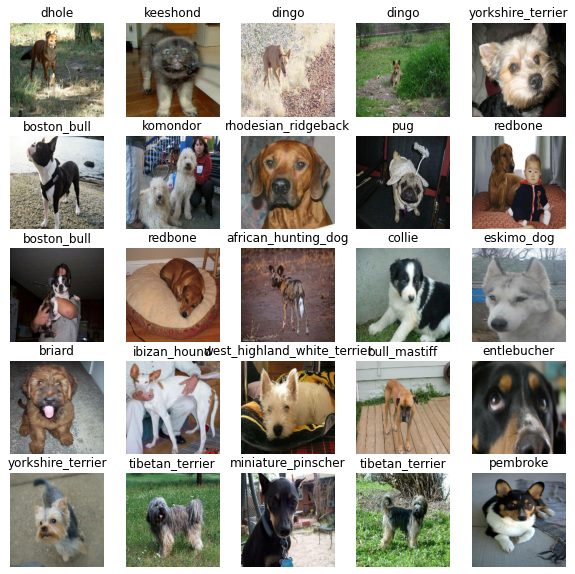

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

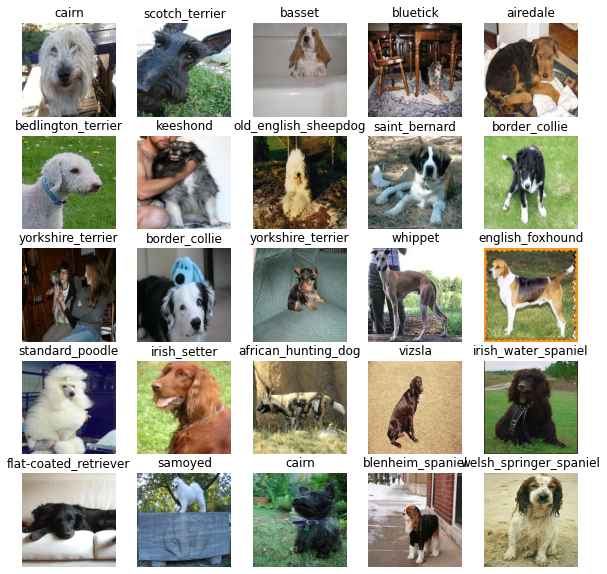

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a Model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we ave got our input, output and model ready to use.
Lets put them togetherin keras deep learning model.
Knowing this lets create a function 
* Takes the input shape output shape and the model chosen as parameters.
* Defines the layers in a keras model in a sequential equation.
* Compiles the model (Evaluates and improve the model) 
* Builds the model
* Returns the model

In [ ]:
# Create the function for keras model.
def create_model(input_shape= INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:",MODEL_URL)

  #Setup model layers
  model = tf.keras.Sequential([
  hub.KerasLayer(MODEL_URL), # Layer 1 (inputlayer)
  tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") #Layer 2 (outputlayer)
  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Builds the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks.
Callbacks are helper function a model can use to during training to do such things as save its progress, check its progress or stop training early if the model has stopped improving.

We will use two callbacks, one for tensorboard which helps track our models progress and another one to stop training if the model has stoppped training.

* Load tensorboard
* Create tensorboard callback which is able to save logs to directory and pass it to our models `fit()` function.
* Visulaize our model training logswith tensorboard magic funtion

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback 
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience = 3)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.



In [ ]:
NUM_EPOCHS = 100 #@param {type :'slider', min:10, max:100, step:10}

In [ ]:
print("GPU", "available (YES!!)" if tf.config.list_physical_devices("GPU")else "not available")

GPU available (YES!!)


# Lets create a function to train our model
* We will get our model from `create_model()`.
* We will use callbacks from tensorboard using function `create_tensorboard_callbacks()`.
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use.
* Return our model

In [ ]:
# Build a function 

def train_model():
  """
  Trains a model and return a trained version of the model
  """
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x =train_data, 
          epochs = NUM_EPOCHS,
          validation_data = val_data,
          validation_freq = 1,
          callbacks = [tensorboard, early_stopping])
  return model


In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 120s 3s/step - loss: 4.5764 - accuracy: 0.0925 - val_loss: 3.4936 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.6379 - accuracy: 0.6687 - val_loss: 2.2681 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 113ms/step - loss: 0.5709 - accuracy: 0.9275 - val_loss: 1.7776 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 115ms/step - loss: 0.2603 - accuracy: 0.9837 - val_loss: 1.5623 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1471 - accuracy: 0.9975 - val_loss: 1.4762 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 115ms/step - loss: 0.1009 - accuracy: 1.0000 - val_loss: 1.4281 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

**Question**: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note** : Overfitting to begin with is a good thing! It means our model is learning!!!

Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making predictions on our data



In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 89ms/step


array([[2.44981423e-03, 4.14422575e-05, 2.98288680e-04, ...,
        1.96507553e-05, 1.42158251e-05, 3.02098389e-03],
       [5.54420752e-04, 1.45454585e-04, 3.84174101e-03, ...,
        2.43986535e-04, 1.67130306e-03, 5.27121738e-05],
       [1.73018962e-05, 2.43099093e-05, 1.16053525e-06, ...,
        1.40699385e-05, 3.39515063e-05, 4.19130047e-05],
       ...,
       [1.32165487e-05, 1.84661021e-05, 1.05940664e-04, ...,
        3.88594162e-05, 2.14800384e-04, 4.82256910e-05],
       [3.80248064e-03, 6.52386880e-05, 4.43235440e-05, ...,
        1.35132461e-04, 1.36003537e-05, 5.24194632e-03],
       [5.32014936e-04, 1.51232225e-05, 3.21378931e-03, ...,
        7.17941346e-03, 5.97827369e-04, 1.48723615e-04]], dtype=float32)

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.50512515e-05 2.51487745e-05 8.16921092e-05 4.34822468e-05
 8.23125825e-04 2.60751331e-05 5.89466035e-05 1.07429433e-03
 4.94936574e-03 4.41294611e-02 1.09738685e-05 6.68172015e-06
 1.55630099e-04 4.06312710e-03 1.64924757e-04 1.66895334e-03
 5.40954388e-05 1.93595406e-04 3.04932619e-05 1.56458846e-04
 4.75621455e-05 1.41972268e-04 2.35108873e-05 2.68344284e-05
 4.55748243e-03 2.19152244e-05 3.41699924e-05 9.40978207e-05
 4.37041272e-05 1.13512731e-04 3.44016189e-05 1.77463153e-04
 2.26407501e-05 2.13924777e-05 5.16957189e-05 8.42062764e-06
 6.09176168e-05 8.44127208e-05 1.76649191e-05 2.00470746e-01
 1.13078720e-04 4.63553406e-05 7.52816675e-04 1.22876475e-06
 3.99155950e-04 3.95175521e-05 3.34582437e-05 7.73874403e-04
 2.04440948e-05 1.05452622e-04 4.13277958e-05 4.18725358e-05
 7.36141446e-05 6.48231886e-04 9.05884463e-06 3.28641705e-04
 6.76318741e-05 3.80147503e-05 8.67965791e-05 5.56756677e-05
 2.26726879e-05 2.16126631e-04 4.82099585e-06 2.46138807e-05
 1.08597596e-04 6.128226

In [ ]:
# Turn prediction probability into their respective labels (easier to understand)
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_labels(predictions[81])
pred_label                            

'dingo'

Now since our validation data is in batch form we will have to unbatch it to make prediction on the validation images and then compare that data to  those predictions of the validation set.


In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the batched data.

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_labels(predictions[0])

'border_terrier'

Now we have got ways to get:
* Predicted Labels
* Validation labels
* Validation images

Lets make a function that make these stuff a little more visualize.

We will create a function that:
* Takes an array of prediction probabilities, an array of truth labels and images and integers
* Convert Prediction probabilities to predicted labels
* Plot the predicted labels, its predicted probabilty, truth label target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image & remove ticks|
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

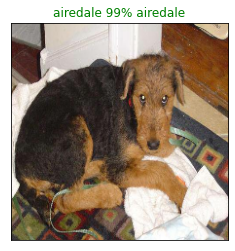

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=4)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer 
* Find the prediction using get_pred_label() 
* Find the top 10
 * Prediction probabilities indexes 
 * Prediction probabilities values 
 * Prediction Labels
* Plot the top 10 prediction probability values and labels, coloring the true label green 

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top predictions  along with true labels
  """
  pred_prob, true_labels = prediction_probabilities[n], labels[n]

  pred_labels = get_pred_labels(pred_prob)

# Find the top 10 prediction confidance indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
              rotation = "vertical")
  
  if np.isin(true_labels, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_labels)].set_color("green")
  else:
    pass

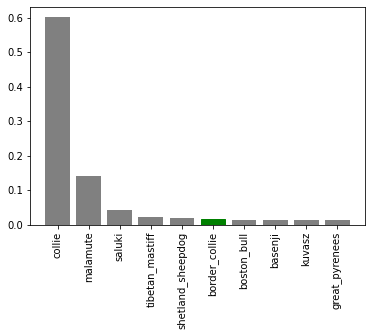

In [ ]:
plot_pred_conf(prediction_probabilities = predictions, labels= val_labels, n=9)

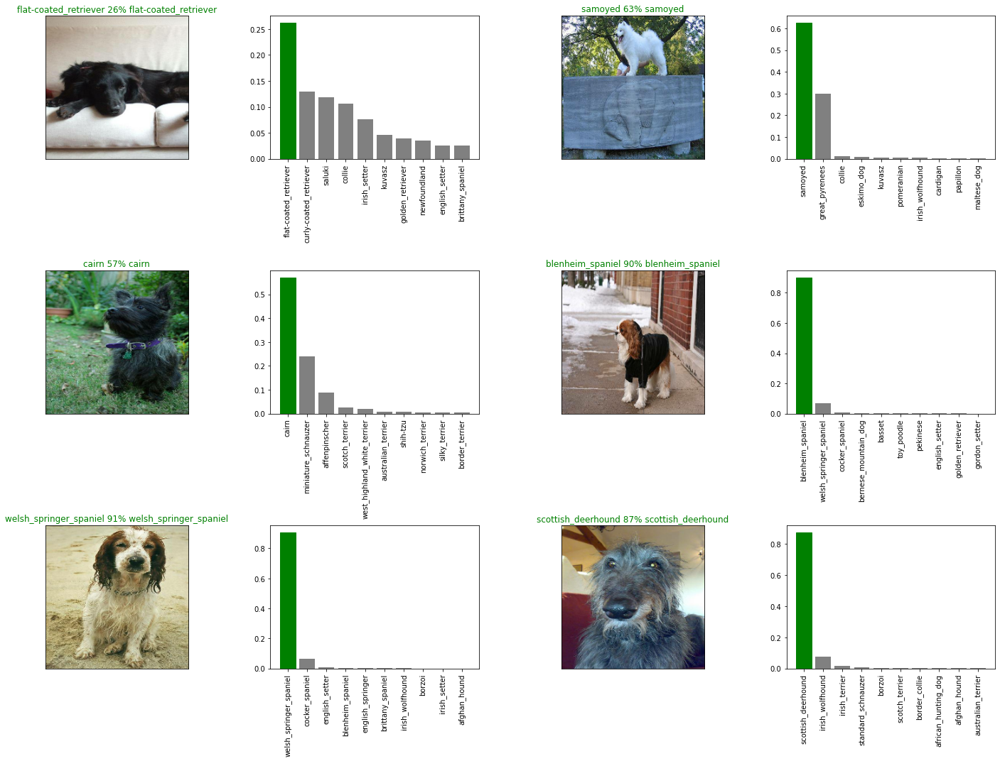

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
from sklearn import metrics

## Saving and reloading model

In [ ]:
# Create a function to save model.
def save_model(model, suffix=None):
  """
  Saves a given modelin a models directory with a suffix as string
  """
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir+ "-"+suffix+".h5"
  print(f"Saving model to :{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Vision/models/20230130-07111675062719-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230130-07111675062719-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Create a function to reload a model
def load_model(model_path):
  """
  Load a model from a specified path
  """
  model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20221226-08091672042168-1000-images-mobilenetv2-Adam.h5')

In [ ]:
## Evaluating our pre loaded model
model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.2765 - accuracy: 0.6650


[1.2765201330184937, 0.6650000214576721]

In [ ]:
## Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.3458 - accuracy: 0.6200


[1.3457703590393066, 0.6200000047683716]

# Training a model on Big Dog DataSet




In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Creating a data batch for the full data
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_callbacks = create_tensorboard_callback()
# Getting our early stopping callbacks
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor ="accuracy", 
                                                             patience=3)

In [ ]:
# fit the full model on the fdull data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_callbacks, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 43s 122ms/step - loss: 1.3293 - accuracy: 0.6733
Epoch 2/100
320/320 [==============================] - 29s 92ms/step - loss: 0.3988 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 30s 93ms/step - loss: 0.2366 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1526 - accuracy: 0.9667
Epoch 5/100
320/320 [==============================] - 29s 92ms/step - loss: 0.1074 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0771 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0580 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0458 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0382 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 29s 91ms/step -

In [ ]:
save_model(full_model, suffix = "full-images-mobilenetv2-Adam")

Saving model to :drive/MyDrive/Dog Vision/models/20230130-07251675063522-full-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230130-07251675063522-full-images-mobilenetv2-Adam.h5'

In [ ]:

loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20221226-09481672048122-full-images-mobilenetv2-Adam.h5")


# Training our model on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches()   
 and setting the test_data parameter to True (since the test data doesn't     have labels). ✅
* Make a predictions array by passing the test batches to the predict() 
 method called on our model.

In [ ]:
test_path = "drive/MyDrive/Dog Vision/test/" 
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]



['drive/MyDrive/Dog Vision/test/e2537e98808877c707bfe8ca53e303b7.jpg',
 'drive/MyDrive/Dog Vision/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 'drive/MyDrive/Dog Vision/test/df903a0522873bebca93d1d93bc60bc4.jpg',
 'drive/MyDrive/Dog Vision/test/e4235f4b313a4b49946938992dd95249.jpg',
 'drive/MyDrive/Dog Vision/test/df9ee3c663b1f2ca84781c09fa8c31f8.jpg',
 'drive/MyDrive/Dog Vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg',
 'drive/MyDrive/Dog Vision/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog Vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Dog Vision/test/e79030be9c9769f3604474aea16039bd.jpg',
 'drive/MyDrive/Dog Vision/test/df38352b1f41c92d6750b87b55488ed4.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data = True)
test_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** : Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
#Make predictions on test data
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 32s 100ms/step


In [ ]:
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions, delimiter= ',')                                            

In [ ]:
test_predictions = np.loadtxt("drive/ My Drive/Dog Vision/preds_array.csv", delimiter = ",")  

In [ ]:
test_predictions[:10]

array([[2.99465343e-15, 2.83019945e-13, 4.20551594e-16, ...,
        5.08149729e-16, 7.02770497e-14, 1.40323061e-12],
       [1.71992898e-09, 6.28556181e-14, 3.58445478e-13, ...,
        3.15775517e-09, 4.70197074e-06, 3.07971287e-10],
       [2.92995814e-08, 1.52201429e-09, 1.02900119e-11, ...,
        7.05357973e-13, 3.60620626e-12, 4.80091512e-06],
       ...,
       [7.53071390e-12, 1.30303713e-13, 4.90813293e-11, ...,
        1.04131907e-07, 5.21982235e-10, 2.11633142e-11],
       [1.12539914e-03, 4.51863907e-10, 3.95860944e-09, ...,
        9.47783150e-08, 3.31504069e-08, 3.14624884e-07],
       [6.89245871e-15, 2.50096264e-08, 3.69666022e-13, ...,
        1.36762355e-11, 4.93539020e-12, 1.58497922e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

Preparing the test dataset prediction for Kaggle. 


In [ ]:
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path

'drive/MyDrive/Dog Vision/test/'

In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] =  test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e2537e98808877c707bfe8ca53e303b7', '.jpg')

In [ ]:
preds_df.head(5)

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2537e98808877c707bfe8ca53e303b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df99a948e43d3399aff2e8ab2c18e184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df903a0522873bebca93d1d93bc60bc4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4235f4b313a4b49946938992dd95249,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df9ee3c663b1f2ca84781c09fa8c31f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
 preds_df[list(unique_breeds)] = test_predictions
 preds_df.head(5)

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2537e98808877c707bfe8ca53e303b7,2.994653e-15,2.830199e-13,4.205516e-16,2.192388e-13,2.324537e-12,8.796937e-16,4.700740e-11,1.048143e-12,7.918237e-14,...,8.193489e-12,2.243388e-15,1.406632e-15,1.143532e-13,2.592052e-15,3.358764e-14,6.274316e-14,5.081497e-16,7.027705e-14,1.403231e-12
1,df99a948e43d3399aff2e8ab2c18e184,1.719929e-09,6.285562e-14,3.584455e-13,6.937829e-05,9.594320e-11,1.173837e-11,7.816348e-14,3.202947e-12,6.784782e-11,...,3.927889e-09,1.923689e-12,6.289394e-12,8.111583e-09,6.218943e-12,2.304487e-10,1.253925e-10,3.157755e-09,4.701971e-06,3.079713e-10
2,df903a0522873bebca93d1d93bc60bc4,2.929958e-08,1.522014e-09,1.029001e-11,6.475834e-11,2.798085e-12,4.244680e-11,3.009061e-06,1.124139e-11,1.818591e-11,...,1.572930e-09,1.808434e-12,2.317520e-10,2.302465e-14,6.299544e-13,3.940577e-08,2.296070e-11,7.053580e-13,3.606206e-12,4.800915e-06
3,e4235f4b313a4b49946938992dd95249,2.367894e-11,1.859392e-12,1.151414e-15,6.776333e-15,1.966307e-13,2.355864e-12,5.370995e-17,2.178493e-13,9.340492e-15,...,6.198416e-12,7.879737e-14,2.874393e-13,1.084641e-13,1.908053e-14,4.459662e-14,2.859840e-14,9.909844e-15,2.251665e-10,1.152669e-10
4,df9ee3c663b1f2ca84781c09fa8c31f8,4.433125e-16,4.249202e-16,2.257355e-15,7.593044e-16,1.783795e-15,8.280900e-17,6.601709e-16,1.095946e-14,7.090954e-16,...,1.056351e-16,5.343210e-12,4.479909e-16,1.260415e-16,1.910419e-17,1.461431e-18,9.819310e-16,3.564753e-12,1.463054e-14,8.267170e-17


In [ ]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv", index = False)

## MAking Predictions on our custom images 

In [ ]:
custom_path ="drive/MyDrive/Dog Vision/my-dogs/"

In [ ]:
custom_img_paths =[custom_path + fname for fname in os.listdir(custom_path)] 

In [ ]:
custom_img_paths

['drive/MyDrive/Dog Vision/my-dogs/dog 1.jpeg',
 'drive/MyDrive/Dog Vision/my-dogs/dog 2.jpeg',
 'drive/MyDrive/Dog Vision/my-dogs/dog 3.jpeg']

In [ ]:
custom_data = create_data_batches(custom_img_paths, test_data = True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 462ms/step


In [ ]:
custom_preds

array([[6.00687360e-13, 1.16514155e-12, 9.01544724e-12, 1.24910526e-10,
        5.67891334e-09, 9.61570919e-01, 2.36254638e-09, 3.89849854e-11,
        1.82000072e-14, 3.14830345e-07, 1.32042655e-09, 6.44336307e-10,
        1.45130613e-07, 5.32297782e-11, 4.42171050e-10, 3.35747444e-07,
        2.03869832e-09, 3.10423805e-11, 2.09741807e-11, 2.35743514e-07,
        5.72608367e-13, 9.17132310e-14, 3.17962057e-09, 1.83934221e-13,
        3.38255673e-10, 2.35290258e-07, 1.58083690e-14, 2.91527588e-12,
        4.44830589e-10, 1.38180187e-08, 3.90001809e-10, 4.03114075e-09,
        5.18959311e-08, 1.57312218e-06, 5.07192855e-12, 4.21878088e-11,
        8.37320054e-14, 2.39422767e-13, 2.95818481e-10, 1.03188380e-09,
        5.48117163e-10, 7.94721580e-12, 8.52307878e-08, 2.54298811e-07,
        4.07106814e-11, 7.43825834e-12, 2.94128361e-10, 3.08620837e-11,
        2.45602934e-07, 7.00900449e-09, 7.71765851e-09, 4.73006486e-12,
        7.90426169e-10, 1.00446392e-04, 2.33759274e-13, 2.083645

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image predictions labels
custom_pred_labels = [get_pred_labels(custom_preds[i])for i in range(len(custom_preds))]
custom_pred_labels

['appenzeller', 'german_shepherd', 'black-and-tan_coonhound']

In [ ]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

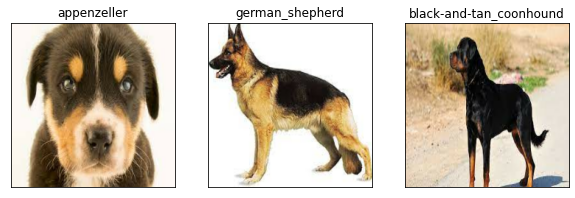

In [ ]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)